In [3]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
from helpers import *
from ourHelpers import *
from models import *

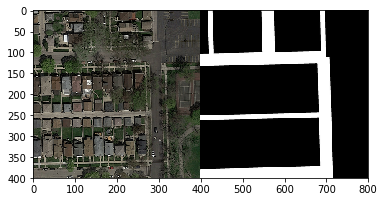

In [4]:
X, Y = load_training_dataset()
plt.imshow(concatenate_images(X[4], Y[4]))
plt.show()

# Load the model

The model is saved inside `model_dir` so the training can be stop at anytime and restart form the same directory

In [5]:
config = tf.estimator.RunConfig()
config._save_summary_steps = 20
model_params = {"learning_rate": 0.01}
my_estimator = tf.estimator.Estimator(model_fn=baseline_model_fn, model_dir="../model_dir",
                                      params=model_params,config=config)

INFO:tensorflow:Using config: {'_model_dir': '../model_dir', '_tf_random_seed': 1, '_save_summary_steps': 20, '_save_checkpoints_secs': 600, '_save_checkpoints_steps': None, '_session_config': None, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100}


# Training
Start or continue training from the model saved at `model_dir`

In [4]:
train_input_fn = tf.estimator.inputs.numpy_input_fn(
    x={"x": X},
    y=Y,
    batch_size=10,
    queue_capacity = 100,  # Important to avoid OOM Error
    num_epochs=None,
    shuffle=True)

#Train
my_estimator.train(input_fn=train_input_fn, steps=500)

(10, 160000)
(10, 160000)
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Restoring parameters from ../model_dir/model.ckpt-865
INFO:tensorflow:Saving checkpoints for 866 into ../model_dir/model.ckpt.
INFO:tensorflow:loss = 5.39878e+06, step = 866
INFO:tensorflow:global_step/sec: 0.597975
INFO:tensorflow:loss = 722236.0, step = 966 (167.233 sec)
INFO:tensorflow:global_step/sec: 0.602859
INFO:tensorflow:loss = 738709.0, step = 1066 (165.876 sec)
INFO:tensorflow:global_step/sec: 0.570663
INFO:tensorflow:loss = 640510.0, step = 1166 (175.235 sec)
INFO:tensorflow:Saving checkpoints for 1221 into ../model_dir/model.ckpt.
INFO:tensorflow:global_step/sec: 0.594944
INFO:tensorflow:loss = 674024.0, step = 1266 (168.083 sec)
INFO:tensorflow:Saving checkpoints for 1365 into ../model_dir/model.ckpt.
INFO:tensorflow:Loss for final step: 704243.0.


## Prediction on the training set

In [8]:
predict_input_fn = tf.estimator.inputs.numpy_input_fn(
    x={"x": X},
    num_epochs=1,
    batch_size= 10,
    queue_capacity = 10,
    shuffle=False)

predictions = [p for p in my_estimator.predict(input_fn=predict_input_fn)]

(?, 400, 400)
INFO:tensorflow:Restoring parameters from ../model_dir/model.ckpt-1365


In [13]:
pred = np.array([p>0.5 for p in predictions])
Y_bin = np.array([y>0.5 for y in Y])
sk_mean_F1_score(Y_bin, pred)

0.61791049680608501

14384


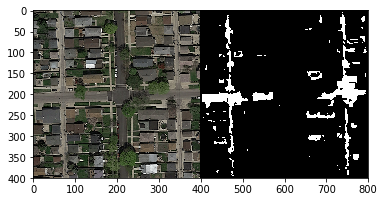

14846


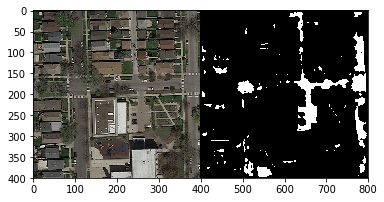

23119


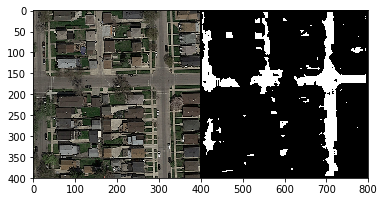

16017


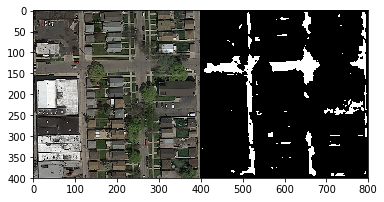

8265


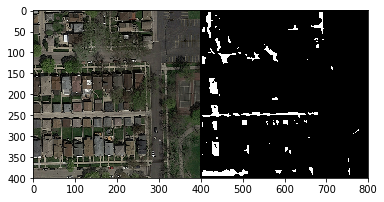

15003


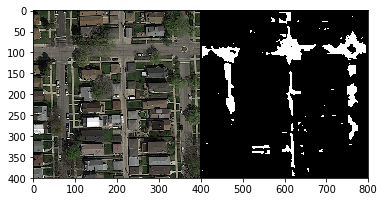

9530


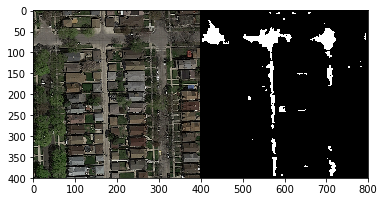

11040


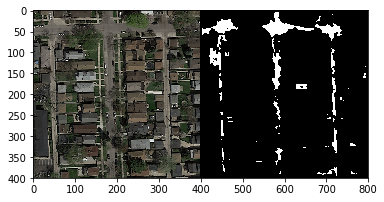

15550


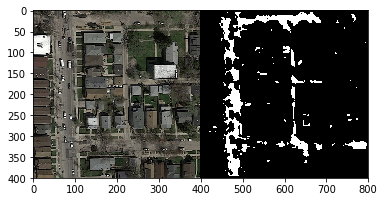

9856


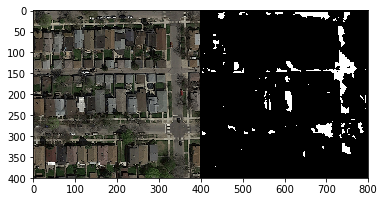

14562


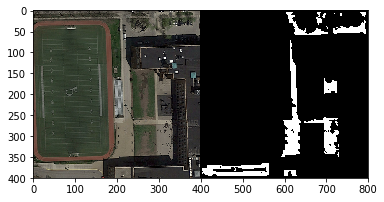

8821


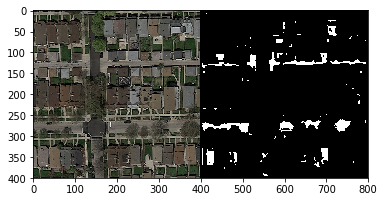

11038


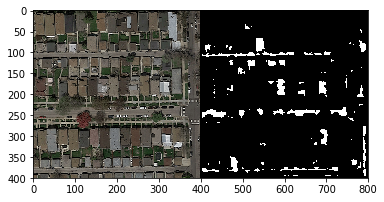

10390


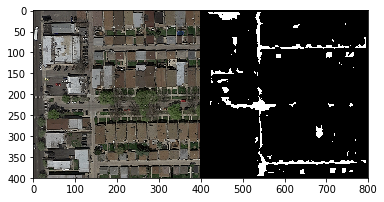

16726


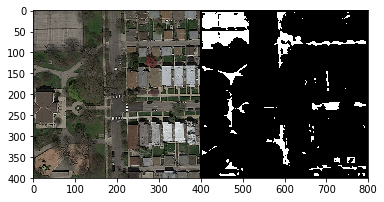

13331


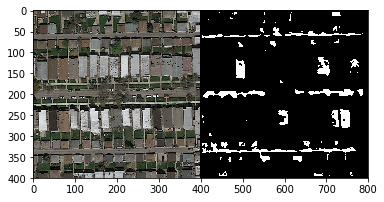

7311


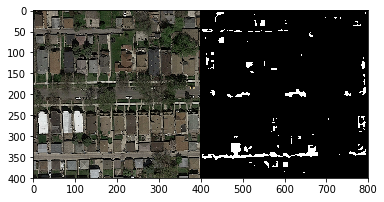

8550


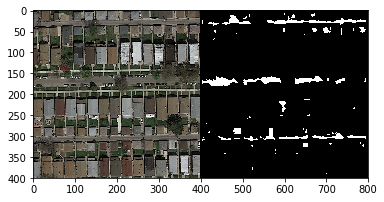

9114


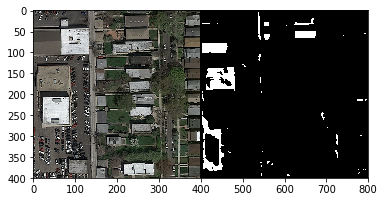

8756


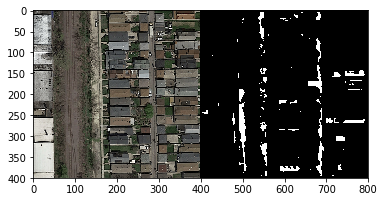

9330


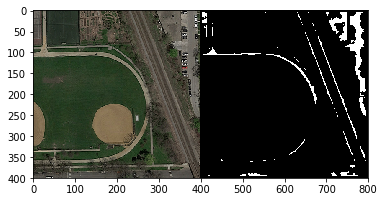

4497


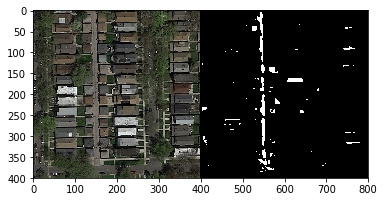

21202


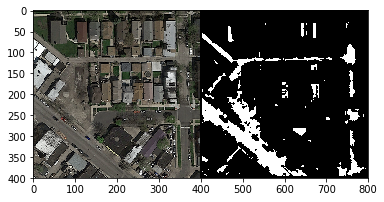

4658


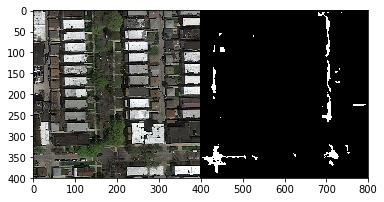

6805


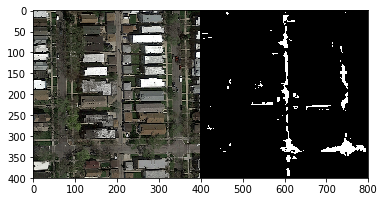

24201


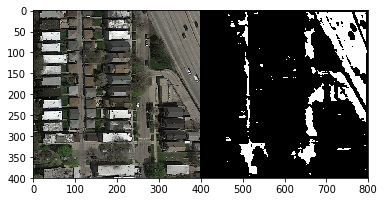

36838


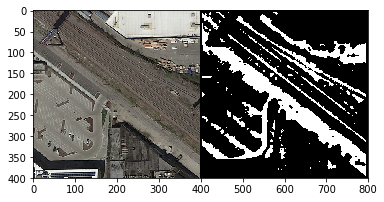

33060


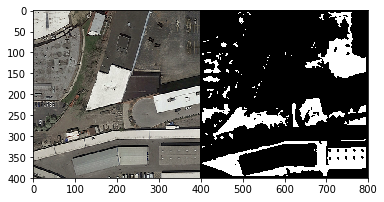

17752


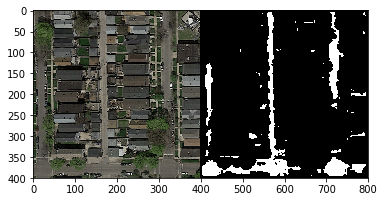

11886


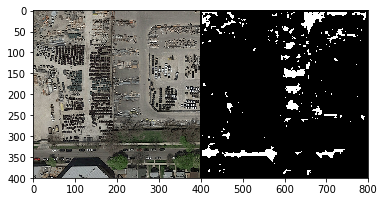

39001


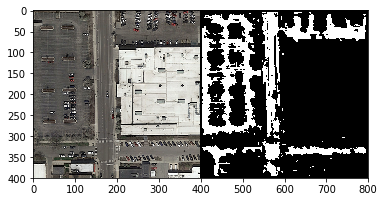

43536


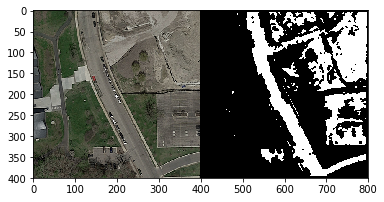

70121


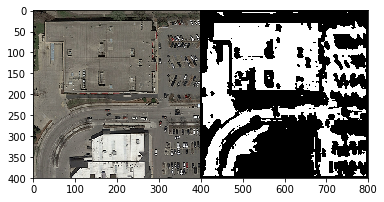

12885


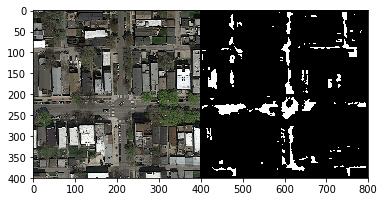

14697


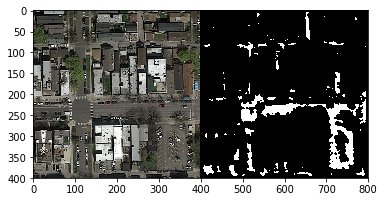

18222


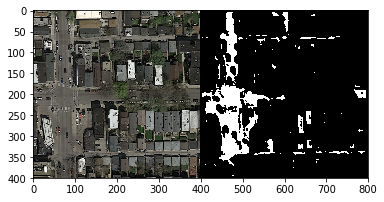

15843


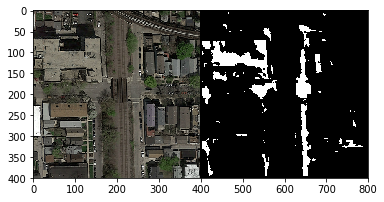

11578


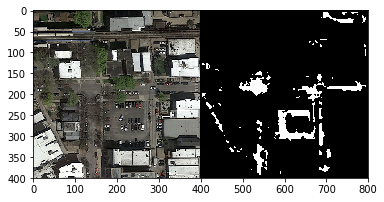

6703


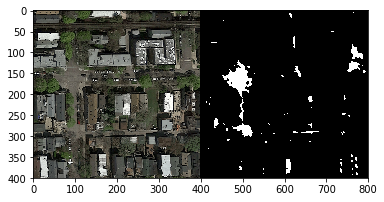

4009


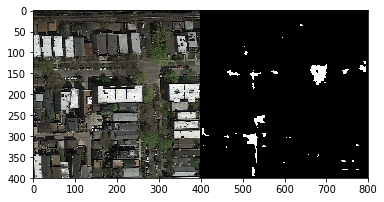

17167


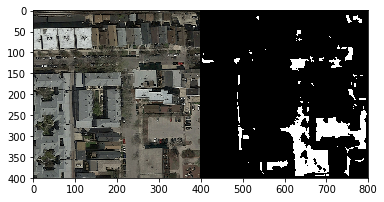

16932


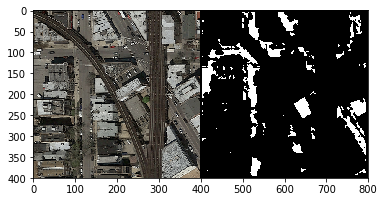

14227


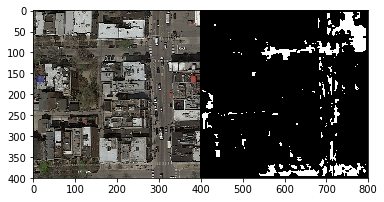

10910


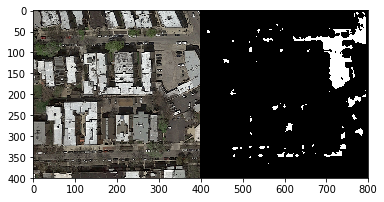

8365


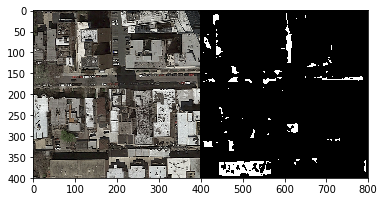

9172


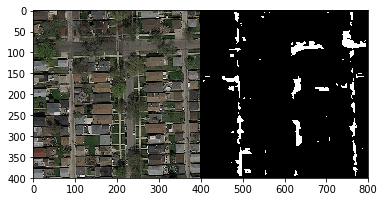

14017


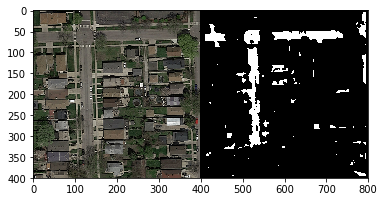

19876


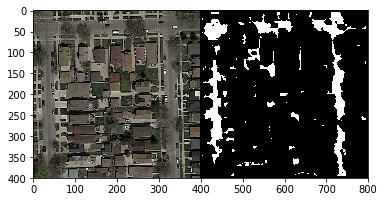

15365


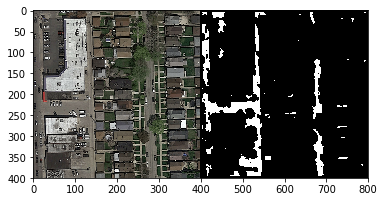

15030


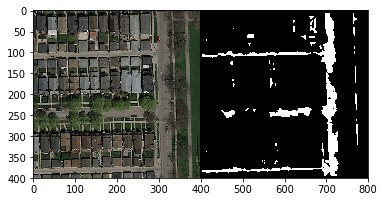

8141


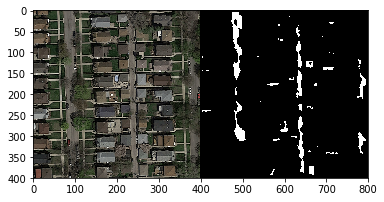

6591


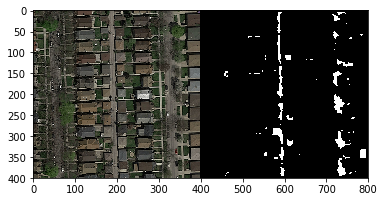

8034


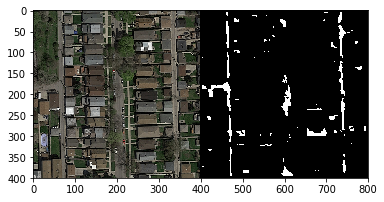

16238


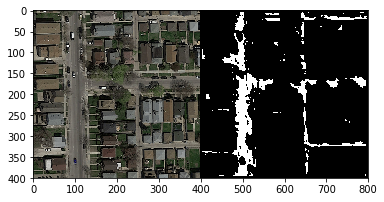

9190


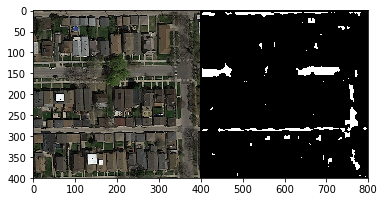

6609


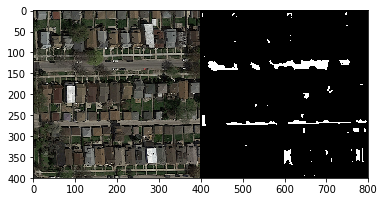

8541


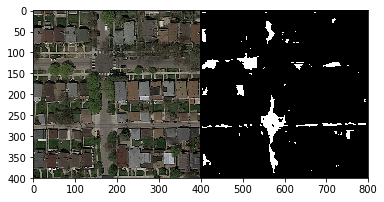

8266


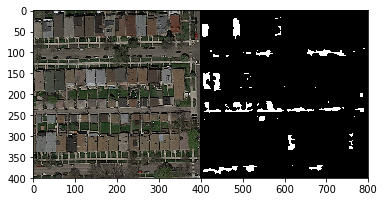

9542


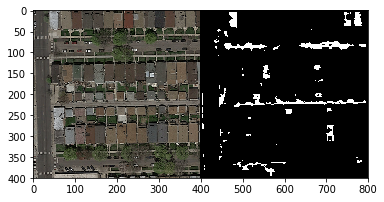

11464


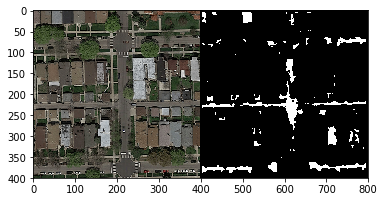

11138


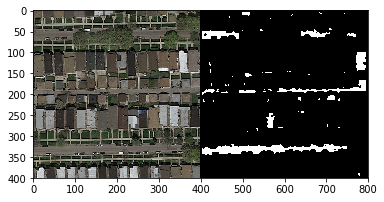

11509


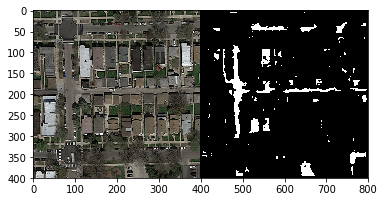

12810


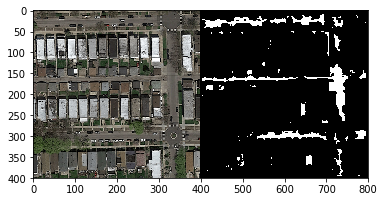

29215


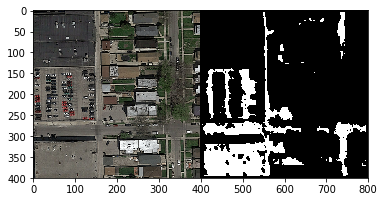

28196


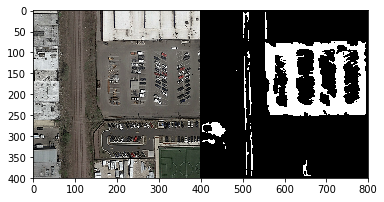

9328


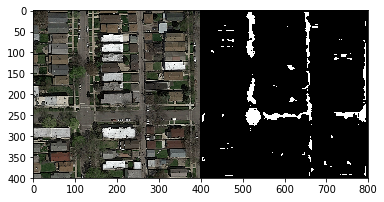

13814


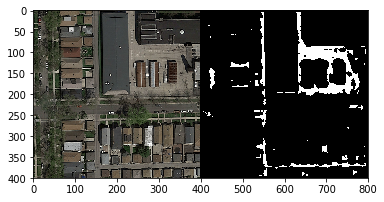

15538


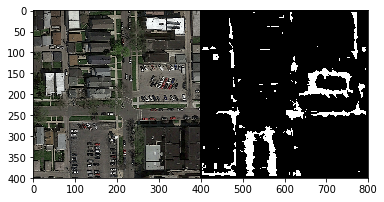

21296


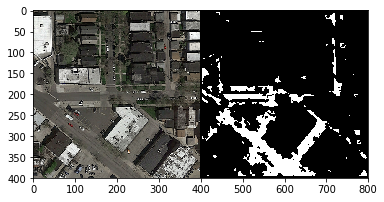

6997


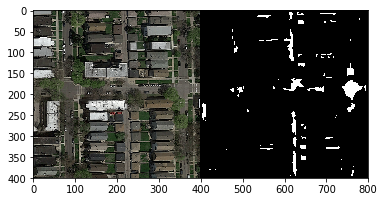

5830


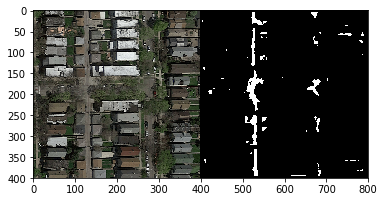

47406


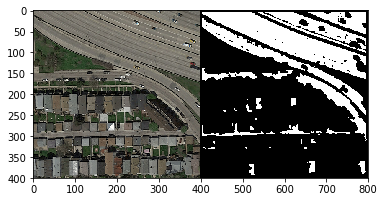

66559


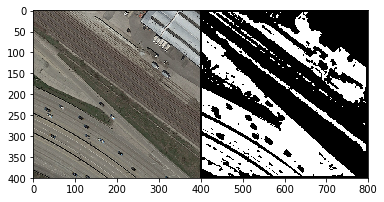

9761


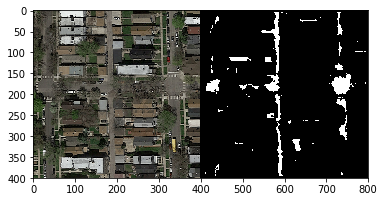

26839


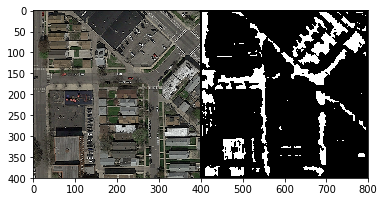

24260


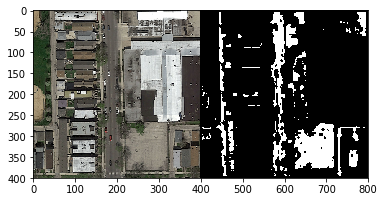

9527


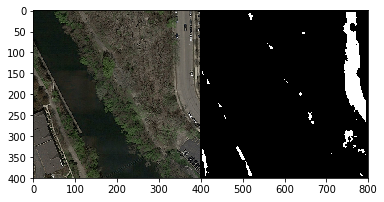

50817


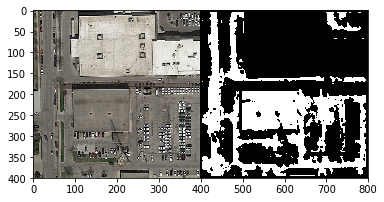

9817


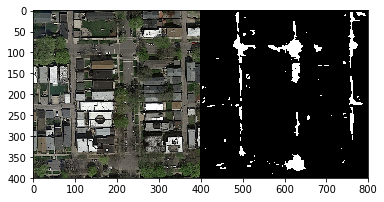

6620


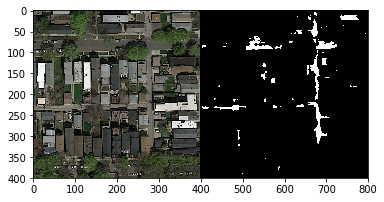

13872


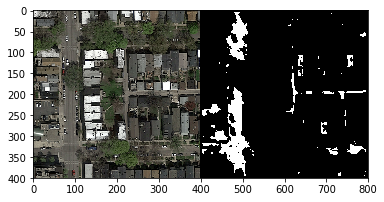

13446


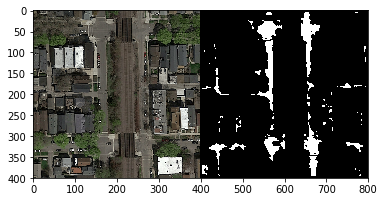

19746


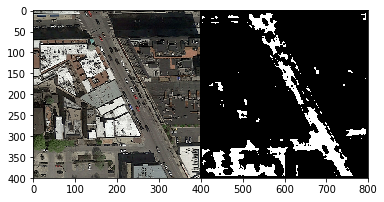

8767


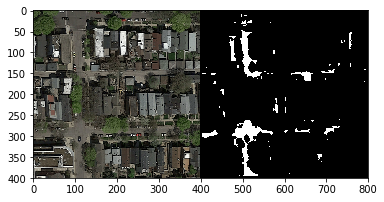

6070


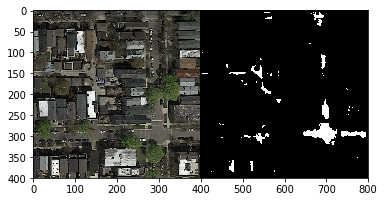

5742


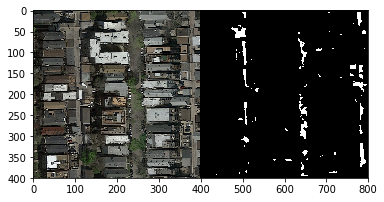

12093


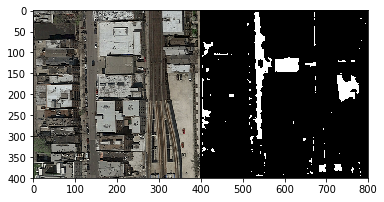

30378


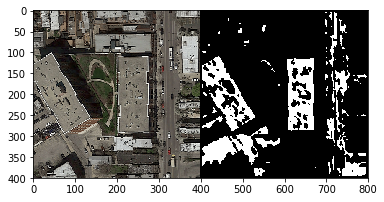

6116


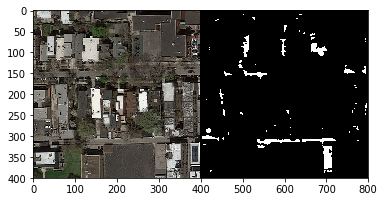

7265


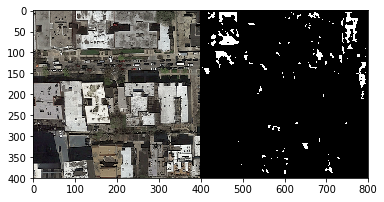

23114


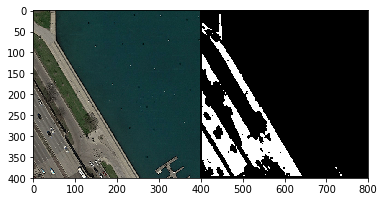

18740


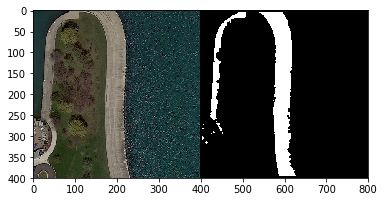

19059


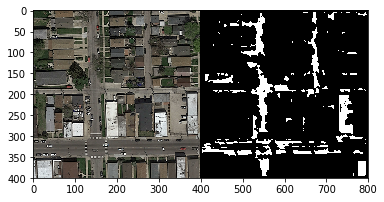

15163


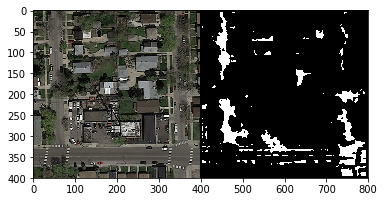

21404


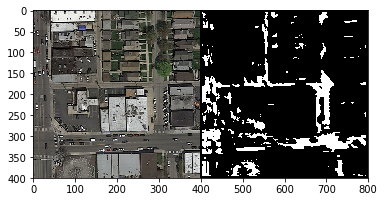

21747


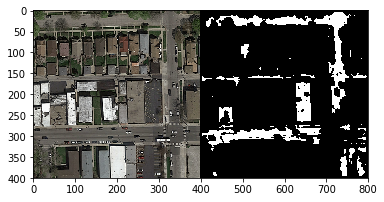

32149


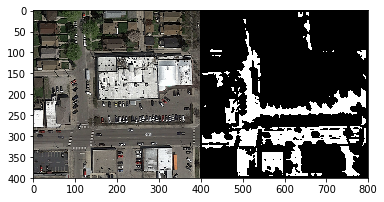

17274


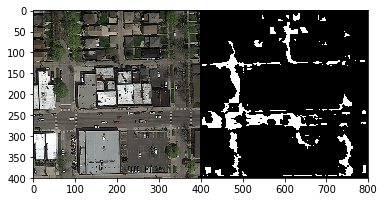

20235


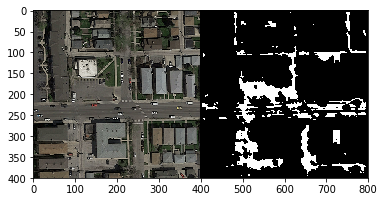

36414


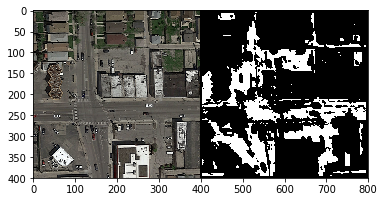

In [9]:
for i, p in enumerate(predictions):
    print(np.sum(p>0.5))
    plt.imshow(concatenate_images(X[i], np.array(p>0.5)))
    #plt.imshow(p)
    plt.show()

# Reference:

How to create your own [estimator](https://www.tensorflow.org/extend/estimators) 